In [1]:
import eispac
import numpy as np
import matplotlib.pyplot as plt
import sunpy
import sunpy.map
import sunpy.coordinates
import pandas as pd
import os
import astropy.units as u
import astropy.constants as const
from astropy.coordinates import SkyCoord
from regions import (PolygonSkyRegion,EllipsePixelRegion, PixCoord)
import shapely
from scipy.io import readsav
import scipy.interpolate
from astropy.visualization import (ImageNormalize, SqrtStretch, 
                                   AsinhStretch, LogStretch)
from eis_straylight import calc_short_range_stray_light, calc_long_range_stray_light_aia_eis, coalign_eis_aia
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import AutoMinorLocator
import cmcrameri.cm as cmcm

In [2]:
aia_131_map = sunpy.map.Map('../../src/AIA/20221021/131/lvl15/aia.lev1_euv_12s.2022-10-21T014039Z.131.image.fits')
aia_171_map = sunpy.map.Map('../../src/AIA/20221021/171/lvl15/aia.lev1_euv_12s.2022-10-21T014039Z.171.image.fits')
aia_193_map = sunpy.map.Map('../../src/AIA/20221021/193/lvl15/aia.lev1_euv_12s.2022-10-21T014039Z.193.image.fits')
aia_211_map = sunpy.map.Map('../../src/AIA/20221021/211/lvl15/aia.lev1_euv_12s.2022-10-21T014039Z.211.image.fits')
aia_335_map = sunpy.map.Map('../../src/AIA/20221021/335/lvl15/aia.lev1_euv_12s.2022-10-21T014039Z.335.image.fits')
aia_94_map = sunpy.map.Map('../../src/AIA/20221021/94/lvl15/aia.lev1_euv_12s.2022-10-21T014039Z.94.image.fits')

In [3]:
eis_file_prefix = '../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.'

In [4]:
eis_FeXII_195_fitres = eispac.read_fit(eis_file_prefix + 'fe_12_195_119.1c-0.fit.h5')
eis_FeXII_195_intmap = eis_FeXII_195_fitres.get_map(component=0, measurement='intensity')
eis_FeXII_195_velmap = eis_FeXII_195_fitres.get_map(component=0, measurement='velocity')
eis_FeXII_195_widmap = eis_FeXII_195_fitres.get_map(component=0, measurement='width')

Txshift_aia_eis_rough, Tyshift_aia_eis_rough = coalign_eis_aia(eis_FeXII_195_intmap, aia_193_map)
eis_FeXII_195_intmap = eis_FeXII_195_intmap.shift_reference_coord(Txshift_aia_eis_rough, Tyshift_aia_eis_rough)
eis_FeXII_195_velmap = eis_FeXII_195_velmap.shift_reference_coord(Txshift_aia_eis_rough, Tyshift_aia_eis_rough)
eis_FeXII_195_widmap = eis_FeXII_195_widmap.shift_reference_coord(Txshift_aia_eis_rough, Tyshift_aia_eis_rough)

c = const.c.cgs.value
amu = const.u.cgs.value
k_B = const.k_B.cgs.value

FeXII_195_true_width_fwhm = np.sqrt((eis_FeXII_195_widmap.data * np.sqrt(8*np.log(2)))**2 - \
                                    eis_FeXII_195_fitres.meta["slit_width"][:,np.newaxis]**2)
FeXII_195_v1oe = FeXII_195_true_width_fwhm/np.sqrt(4*np.log(2))*c/195.119
FeXII_195_vth2 = 2*k_B*10**6.25/amu/55.85
FeXII_195_vnth = np.sqrt(FeXII_195_v1oe**2 - FeXII_195_vth2)
eis_FeXII_195_vnthmap = sunpy.map.Map(FeXII_195_vnth/1e5, eis_FeXII_195_widmap.meta)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_12_195_119.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/2815883421.py:15: RuntimeWarning: invalid value encountered in sqrt
  FeXII_195_true_width_fwhm = np.sqrt((eis_FeXII_195_widmap.data * np.sqrt(8*np.log(2)))**2 - \
/tmp/ipykernel_375380/2815883421.py:19: RuntimeWarning: invalid value encountered in sqrt
  FeXII_195_vnth = np.sqrt(FeXII_195_v1oe**2 - FeXII_195_vth2)


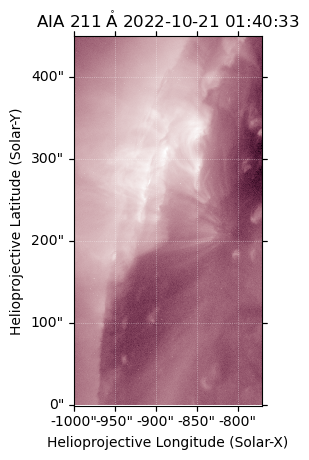

In [5]:
aia_211_map.submap(SkyCoord(-1000*u.arcsec, 0*u.arcsec, frame=aia_211_map.coordinate_frame),
                   top_right=SkyCoord(-770*u.arcsec, 450*u.arcsec, frame=aia_211_map.coordinate_frame)).plot()

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


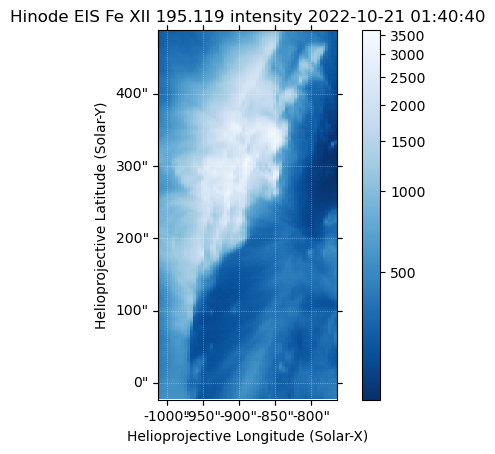

In [6]:
eis_FeXII_195_intmap.plot()
plt.colorbar()

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


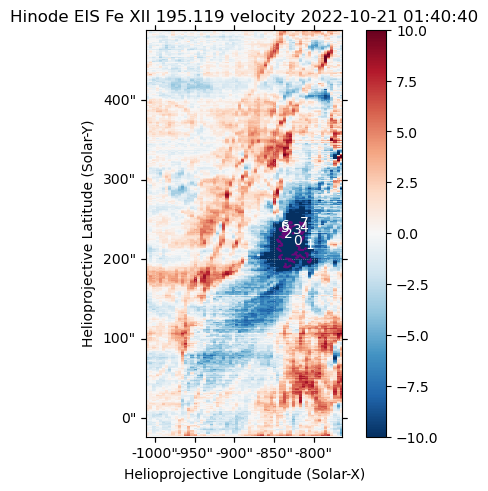

In [7]:
fig = plt.figure(layout='constrained')

ax = fig.add_subplot(111, projection=eis_FeXII_195_velmap)
eis_FeXII_195_velmap.plot(axes=ax)

cs = eis_FeXII_195_velmap.draw_contours(levels=[-15,]*eis_FeXII_195_velmap.unit,colors=["purple"],axes=ax,alpha=0.8)
plt.colorbar()

for ii, seg in enumerate(cs.allsegs[0]):
    ax.text(np.nanmean(seg, axis=0)[0], np.nanmean(seg, axis=0)[1], f'{ii}', color='white', fontsize=10)

# ax.set_xlim(0,20)
# ax.set_ylim(150,350)

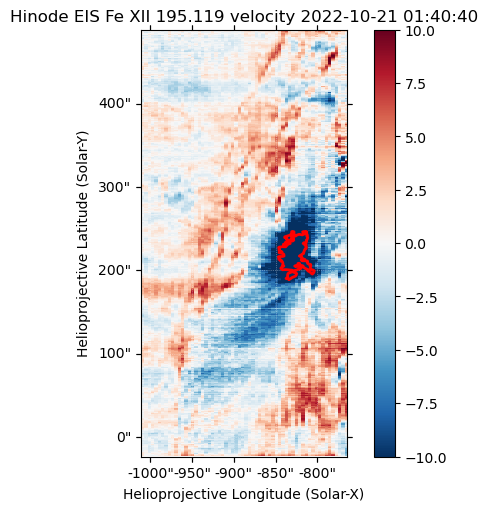

In [8]:
cs_selected_index = [0]
    
fig = plt.figure(figsize=(7, 5),layout='constrained')
ax = fig.add_subplot(111, projection=eis_FeXII_195_velmap)
eis_FeXII_195_velmap.plot(axes=ax)
plt.colorbar()

for ii in cs_selected_index:
    ax.plot(*cs.allsegs[0][ii].T, color='red', lw=2)

In [9]:
cs_skycoords = [eis_FeXII_195_velmap.pixel_to_world(cs.allsegs[0][cs_index][:-1,0]*u.pix,cs.allsegs[0][cs_index][:-1,1]*u.pix) \
                for cs_index in cs_selected_index]
cs_regions = [PolygonSkyRegion(vertices=cs_skycoord) for cs_skycoord in cs_skycoords]

In [10]:
coronal_hole_ref_region_center=SkyCoord(-760*u.arcsec, 280*u.arcsec, frame=eis_FeXII_195_intmap.coordinate_frame)
eis_FeXII_195_intmap_coronal_hole_pixel_region = EllipsePixelRegion(center=PixCoord.from_sky(coronal_hole_ref_region_center, eis_FeXII_195_intmap.wcs),
                                            width=(30*u.arcsec/eis_FeXII_195_intmap.scale.axis1).to_value(u.pix), 
                                            height=(30*u.arcsec/eis_FeXII_195_intmap.scale.axis2).to_value(u.pix))

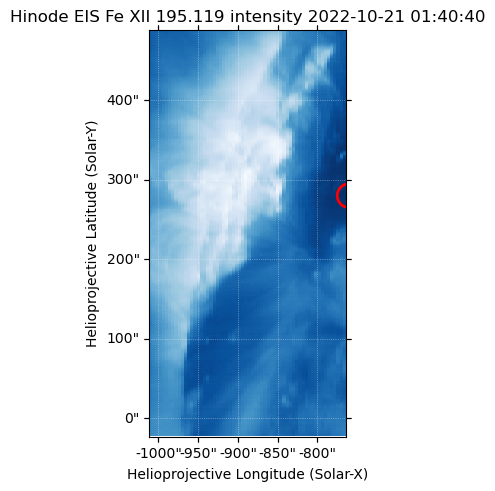

In [11]:
fig = plt.figure(layout='constrained')

ax = fig.add_subplot(111, projection=eis_FeXII_195_intmap)
eis_FeXII_195_intmap.plot(axes=ax)

eis_FeXII_195_intmap_coronal_hole_pixel_region.plot(ax=ax, edgecolor='red', lw=2)

In [12]:
coronal_hole_ref_region_params = {'center':coronal_hole_ref_region_center, 'width':30*u.arcsec, 'height':30*u.arcsec}

In [13]:
def get_sky_region_centroid(sky_region, wcs):
    pixel_region = sky_region.to_pixel(wcs)
    pixel_region_shapely = shapely.geometry.Polygon(np.vstack(pixel_region.vertices.xy).T)
    pixel_region_shapely_centroid = pixel_region_shapely.centroid
    sky_coord_centroid = wcs.pixel_to_world(pixel_region_shapely_centroid.x, pixel_region_shapely_centroid.y)

    return sky_coord_centroid

In [14]:
FeXII_195_sr_stray_light, FeXII_195_sr_stray_light_region = calc_short_range_stray_light(eis_FeXII_195_intmap,
                                                                                        get_sky_region_centroid(cs_regions[0], eis_FeXII_195_intmap.wcs),
                                                                                        return_region=True)

Short range stray light: 44.00


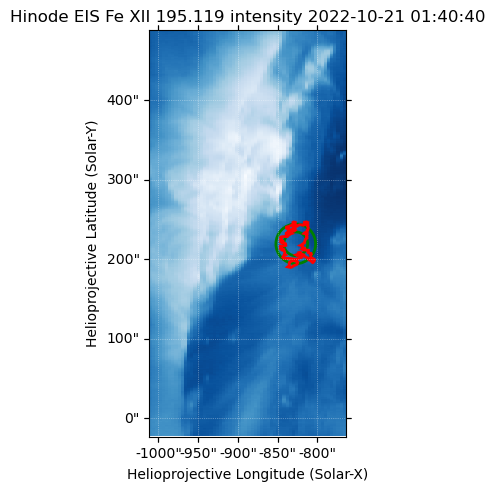

In [15]:
fig = plt.figure(layout='constrained')

ax = fig.add_subplot(111, projection=eis_FeXII_195_intmap)
eis_FeXII_195_intmap.plot(axes=ax)

FeXII_195_sr_stray_light_region.plot(ax=ax, edgecolor='green', lw=2)
cs_regions[0].to_pixel(eis_FeXII_195_intmap.wcs).plot(ax=ax, edgecolor='red', lw=2)

print(f'Short range stray light: {FeXII_195_sr_stray_light:.2f}')

In [16]:
FeXII_lr_stray_light, FeXII_lr_stray_light_coalign_region, _ = calc_long_range_stray_light_aia_eis(eis_FeXII_195_intmap, aia_193_map,
                                                           SkyCoord(-800*u.arcsec, 80*u.arcsec, frame=eis_FeXII_195_intmap.coordinate_frame),
                                                           region_radius = 50*u.arcsec, return_region=True)

Long range stray light: 13.62


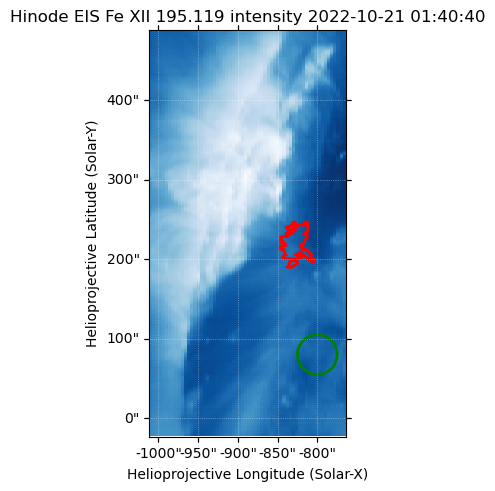

In [17]:
fig = plt.figure(layout='constrained')

ax = fig.add_subplot(111, projection=eis_FeXII_195_intmap)
eis_FeXII_195_intmap.plot(axes=ax)

FeXII_lr_stray_light_coalign_region.plot(ax=ax, edgecolor='green', lw=2)
cs_regions[0].to_pixel(eis_FeXII_195_intmap.wcs).plot(ax=ax, edgecolor='red', lw=2)

print(f'Long range stray light: {FeXII_lr_stray_light:.2f}')

In [18]:
def get_intensity_from_cs_regions(intensity_map, cs_regions):
    intensity = []
    masks = [np.where(cs_region.contains(sunpy.map.all_coordinates_from_map(intensity_map), 
                                                intensity_map.wcs)) for cs_region in cs_regions]
    intensity = [intensity_map.data[mask_] for mask_ in masks]
    return intensity

In [19]:
def mean_intensity_in_region(regions_intensity, min=None, max=None):
    if max is not None:
        for region_intensity in regions_intensity:
            mask = np.where(region_intensity > max)
            region_intensity[mask] = np.nan
    if min is not None:
        for region_intensity in regions_intensity:
            mask = np.where(region_intensity < min)
            region_intensity[mask] = np.nan
    return np.array([np.nanmean(region_intensity) for region_intensity in regions_intensity])

In [20]:
eis_radcal_file = readsav('../../sav/eis_radcal_20221025.sav',verbose=True)

--------------------------------------------------
Date: Thu Jun 27 11:54:26 2024
User: yjzhu
Host: NB-RES-YINGJIE
--------------------------------------------------
Format: 12
Architecture: x86_64
Operating System: linux
IDL Version: 8.8.3
--------------------------------------------------
Successfully read 11 records of which:
 - 8 are of type VARIABLE
 - 1 are of type TIMESTAMP
 - 1 are of type VERSION
--------------------------------------------------
Available variables:
 - sw_wvl [<class 'numpy.ndarray'>]
 - lw_wvl [<class 'numpy.ndarray'>]
 - gdz_sw [<class 'numpy.ndarray'>]
 - gdz_lw [<class 'numpy.ndarray'>]
 - hpw_sw [<class 'numpy.ndarray'>]
 - hpw_lw [<class 'numpy.ndarray'>]
 - new_sw [<class 'numpy.ndarray'>]
 - new_lw [<class 'numpy.ndarray'>]
--------------------------------------------------


In [21]:
def get_eis_radcal(wvl,radcal_file=eis_radcal_file,method='hpw'):
    if isinstance(wvl, u.Quantity):
        wvl = wvl.to_value(u.angstrom)
        
    if method == 'hpw':
        lw_radcal = radcal_file['hpw_lw']
        sw_radcal = radcal_file['hpw_sw']
    elif method == 'lpw':
        lw_radcal = radcal_file['lpw_lw']
        sw_radcal = radcal_file['lpw_sw']
    elif method == 'new':
        lw_radcal = radcal_file['new_lw']
        sw_radcal = radcal_file['new_sw']
    
    if 165 < wvl < 212:
        radcal = sw_radcal
        wvl_grid = radcal_file['sw_wvl']
    elif 245 < wvl < 292:
        radcal = lw_radcal
        wvl_grid = radcal_file['lw_wvl']
    else:
        raise ValueError('Wavelength out of range')
    
    radcal_interp_func = scipy.interpolate.interp1d(wvl_grid, radcal, kind='cubic', fill_value='extrapolate')
    return radcal_interp_func(wvl)

In [22]:
def plot_colorbar(im, ax, width="3%", height="100%",loc="lower left",fontsize=14,
                  bbox_to_anchor=(1.02, 0., 1, 1),orientation="vertical"):
    clb_ax = inset_axes(ax,width=width,height=height,loc=loc,
                bbox_to_anchor=bbox_to_anchor,
                 bbox_transform=ax.transAxes,
                 borderpad=0)
    clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)
    clb_ax.yaxis.set_minor_locator(AutoMinorLocator(5))
    clb_ax.yaxis.get_offset_text().set_fontsize(fontsize)
    clb_ax.tick_params(labelsize=fontsize)
    return clb, clb_ax

In [23]:
def read_eis_fit_and_return_upflow_int(eis_file_prefix, eis_line_name,cs_regions,
                                       component=0, radcal_file=eis_radcal_file, method='hpw',
                                       int_hist=0, min=None, max=None, reference_region_params=None,
                                       short_range_stray_light=False, long_range_stray_light=False,
                                       long_range_stray_light_aia_ref=None, 
                                       long_range_stray_light_ref_center=None,
                                       long_range_stray_light_ref_radius=None,
                                       eis_aia_shift = (Txshift_aia_eis_rough, Tyshift_aia_eis_rough),
                                       eis_chi2_mask_threshold=50):
    
    eis_fitres = eispac.read_fit(eis_file_prefix + eis_line_name + '.fit.h5')
    eis_intmap = eis_fitres.get_map(component=component, measurement='intensity')

    if eis_chi2_mask_threshold is not None and eis_chi2_mask_threshold > 0:
        chi2_mask = np.where(eis_fitres.fit['chi2'] > eis_chi2_mask_threshold)
        eis_intdata = eis_intmap.data.copy()
        eis_intdata[chi2_mask] = np.nan
        eis_intmap = sunpy.map.Map(eis_intdata, eis_intmap.meta)
        
    if eis_aia_shift is not None:
        eis_intmap = eis_intmap.shift_reference_coord(*eis_aia_shift)
    eis_intmap.plot_settings['norm'] = ImageNormalize(vmin=np.nanpercentile(eis_intmap.data, 0.5),
                                                      vmax=np.nanpercentile(eis_intmap.data, 99.5),
                                                      stretch=AsinhStretch(0.1))
    eis_intmap.plot_settings['cmap'] = 'plasma'

    eis_regions_int = get_intensity_from_cs_regions(eis_intmap, cs_regions)
    eis_regions_int_mean = mean_intensity_in_region(eis_regions_int, min=min, max=max)
    eis_radcal_factor = get_eis_radcal(eis_intmap.wavelength, radcal_file=radcal_file, method=method)
    eis_regions_int_mean_radcal = eis_regions_int_mean*eis_radcal_factor
    
    fig = plt.figure(figsize=(7, 5),layout='constrained')
    ax = fig.add_subplot(111, projection=eis_intmap)
    eis_intmap.plot(axes=ax)
    
    for ii, region in enumerate(cs_regions):
        ax.plot_coord(region.vertices, color='red', lw=2, label='Upflow Region' if ii == 0 else '')
    
    if reference_region_params is not None:
        referene_circle_pixel_region = EllipsePixelRegion(center=PixCoord.from_sky(reference_region_params['center'], eis_intmap.wcs),
                                            width=(reference_region_params['width']/eis_intmap.scale.axis1).to_value(u.pix), 
                                            height=(reference_region_params['height']/eis_intmap.scale.axis2).to_value(u.pix))
        referene_circle_pixel_region.plot(ax=ax, edgecolor='blue', lw=2, label='CH Ref. Region')

    if short_range_stray_light or long_range_stray_light:
        stray_light_int = np.zeros((len(cs_regions),2))
        sr_stray_light_regions = []
        if short_range_stray_light is True:
            for ii, region in enumerate(cs_regions):
                sr_stray_light, sr_stray_light_region = calc_short_range_stray_light(eis_intmap,
                                                                                    get_sky_region_centroid(region, eis_intmap.wcs),
                                                                                    return_region=True)
                stray_light_int[ii,0] = sr_stray_light
                sr_stray_light_regions.append(sr_stray_light_region)

        if long_range_stray_light is True:
            lr_stray_light, lr_stray_light_coalign_region, lr_stray_light_aia_region = \
                            calc_long_range_stray_light_aia_eis(eis_intmap, long_range_stray_light_aia_ref,
                            SkyCoord(*long_range_stray_light_ref_center, frame=eis_intmap.coordinate_frame),
                            region_radius = long_range_stray_light_ref_radius,
                            return_region=True)
            
            lr_stray_light_coalign_region.plot(ax=ax, edgecolor='yellow', lw=2, label='LRSL Ref. Region')
            stray_light_int[:,1] = lr_stray_light

            with sunpy.coordinates.Helioprojective.assume_spherical_screen(long_range_stray_light_aia_ref.observer_coordinate,only_off_disk=True):
                aia_map_crop = long_range_stray_light_aia_ref.submap(eis_intmap.bottom_left_coord, top_right=eis_intmap.top_right_coord)
            fig_aia = plt.figure(figsize=(7, 5),layout='constrained')
            ax_aia = fig_aia.add_subplot(111, projection=aia_map_crop)
            aia_map_crop.plot(axes=ax_aia)
            lr_stray_light_aia_region.to_sky(long_range_stray_light_aia_ref.wcs).to_pixel(aia_map_crop.wcs).plot(ax=ax_aia, edgecolor='yellow', lw=2, label='LRSL AIA Ref. Region')
            
    if int_hist is not False:
        if isinstance(int_hist, int) and (0 <= int_hist < len(cs_regions)):
            fig_hist, ax_hist = plt.subplots(layout='constrained')
            ax_hist.hist(eis_regions_int[int_hist], bins=10, histtype='step', color='red', lw=2, 
                    range=(np.nanmin(eis_regions_int[int_hist]),np.nanmax(eis_regions_int[int_hist])),
                    label='Region ' + str(int_hist), weights=np.ones_like(eis_regions_int[int_hist])/len(eis_regions_int[int_hist]))
            
            if min is not None:
                ax_hist.axvline(min, color='red', lw=2, ls='--')
            if max is not None:
                ax_hist.axvline(max, color='red', lw=2, ls='--')
        
        if reference_region_params is not None:
            reference_region_mask = np.where(referene_circle_pixel_region.contains(PixCoord.from_sky(sunpy.map.all_coordinates_from_map(eis_intmap),
                                                                                                     eis_intmap.wcs)))
            ax_hist.hist(eis_intmap.data[reference_region_mask], bins=10, histtype='step', color='blue', lw=2, 
                    range=(np.nanmin(eis_intmap.data[reference_region_mask]),np.nanmax(eis_intmap.data[reference_region_mask])),
                    label='Reference Region', weights=np.ones_like(eis_intmap.data[reference_region_mask])/len(eis_intmap.data[reference_region_mask]))
            
        if short_range_stray_light is True:
            ax_hist.axvline(stray_light_int[int_hist,0], color='green', lw=2, ls='--', label='SR Stray Light')
            sr_stray_light_regions[int_hist].plot(ax=ax, edgecolor='green', lw=2, label='SRSL Region')

        if long_range_stray_light is True:
            ax_hist.axvline(stray_light_int[int_hist,1], color='yellow', lw=2, ls='--', label='LR Stray Light')

        if short_range_stray_light is True and long_range_stray_light is True:
            ax_hist.axvline(np.sum(stray_light_int[int_hist,:]), color='purple', lw=2, ls='--', label='Total Stray Light')
        
        ax_hist.legend(loc='upper right')
        ax_hist.set_xlabel(r'Pre-flight Intensity [erg cm$^{-2}$ s$^{-1}$ sr$^{-1}$]')

    
        ax_leg = ax.legend(bbox_to_anchor=(1.4, 0.7, 0.5, 0.3))
        leg_box = ax_leg.get_window_extent(renderer=fig.canvas.get_renderer())
        leg_box_ax_coords = leg_box.transformed(ax.transAxes.inverted())

        plot_colorbar(ax.images[0],ax,width='5%',bbox_to_anchor=(1.07, 0., 1, leg_box_ax_coords.y0 - 0.05),fontsize=12)

    if short_range_stray_light is True or long_range_stray_light is True:
        return eis_regions_int_mean_radcal, stray_light_int*eis_radcal_factor
    else:
        return eis_regions_int_mean_radcal

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_08_185_213.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


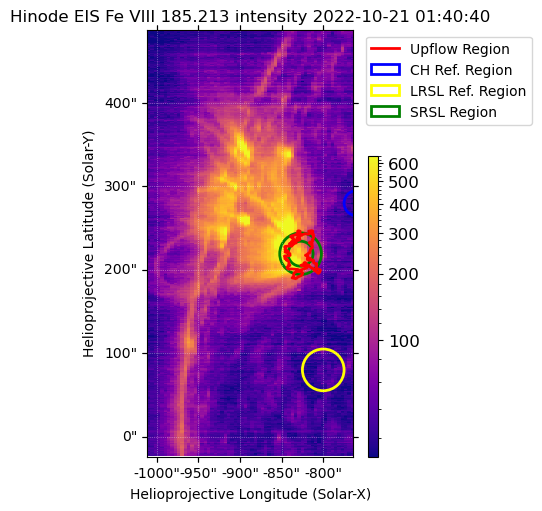

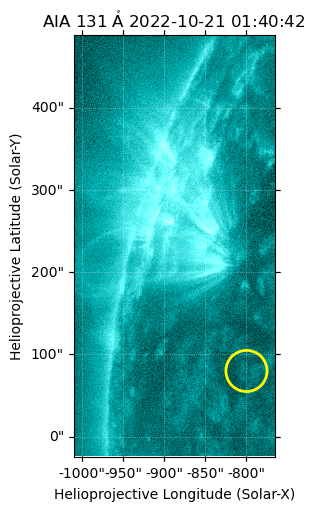

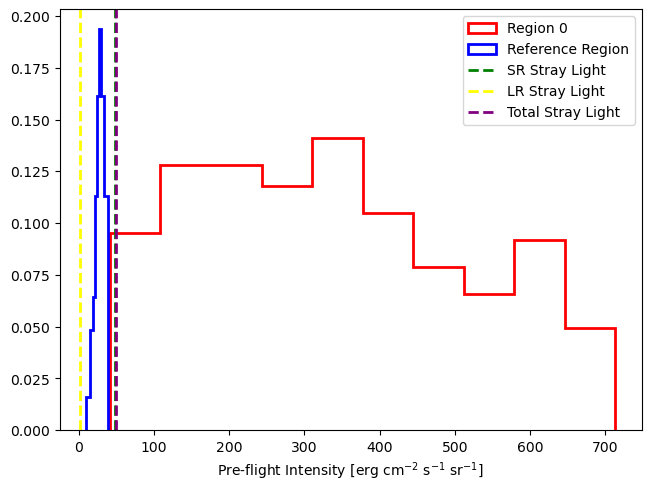

In [24]:
eis_FeVIII_185_upflow_regions_int_mean_radcal, \
eis_FeVIII_185_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_08_185_213.1c-0', cs_regions,
                                                                                   reference_region_params=coronal_hole_ref_region_params,
                                                                                   short_range_stray_light=True, 
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_131_map,
                                                                                   long_range_stray_light_ref_center=[-800,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_08_186_601.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


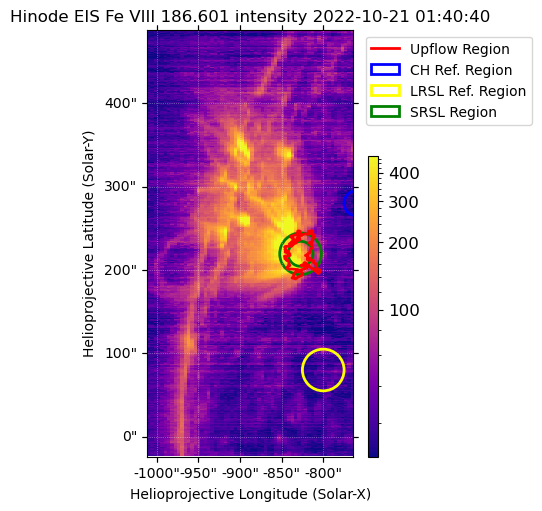

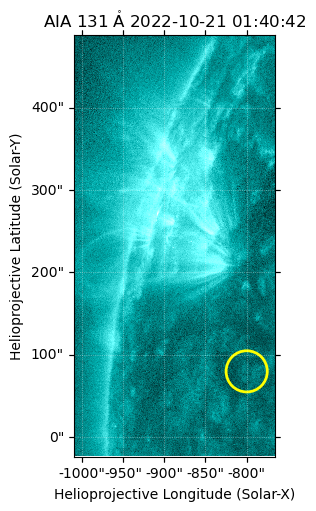

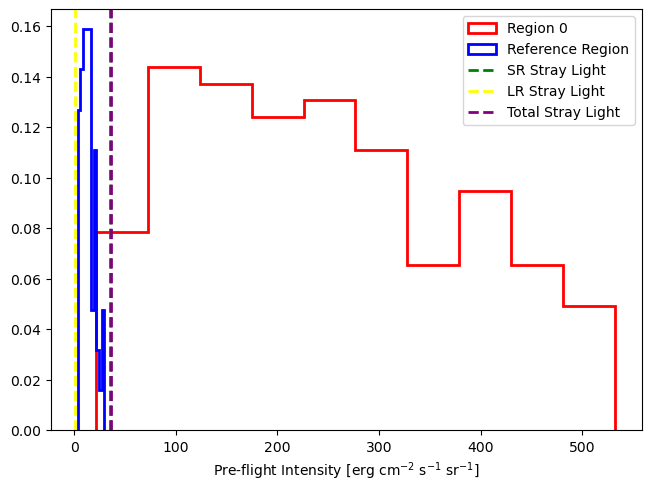

In [25]:
eis_FeVIII_186_upflow_regions_int_mean_radcal, \
eis_FeVIII_186_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_08_186_601.1c-0', cs_regions,
                                                                                   reference_region_params=coronal_hole_ref_region_params,                                                                                                                      
                                                                                   short_range_stray_light=True, 
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_131_map,
                                                                                   long_range_stray_light_ref_center=[-800,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_09_188_497.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


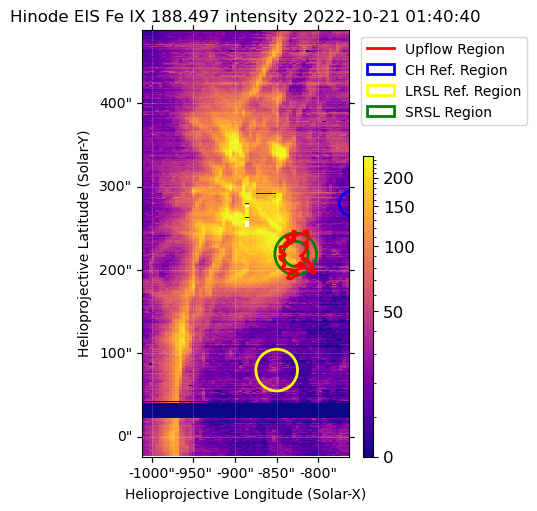

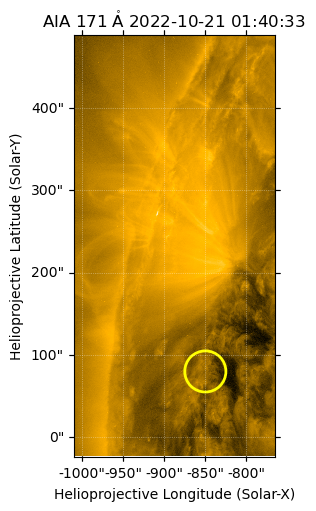

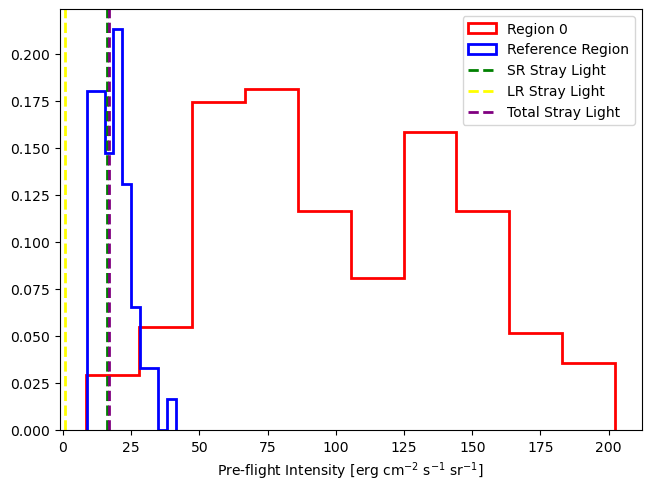

In [26]:
eis_FeIX_188_upflow_regions_int_mean_radcal, \
eis_FeIX_188_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_09_188_497.1c-0', cs_regions,
                                                                                 reference_region_params=coronal_hole_ref_region_params,                                                                                                                      
                                                                                 short_range_stray_light=True, 
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_171_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_09_197_862.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


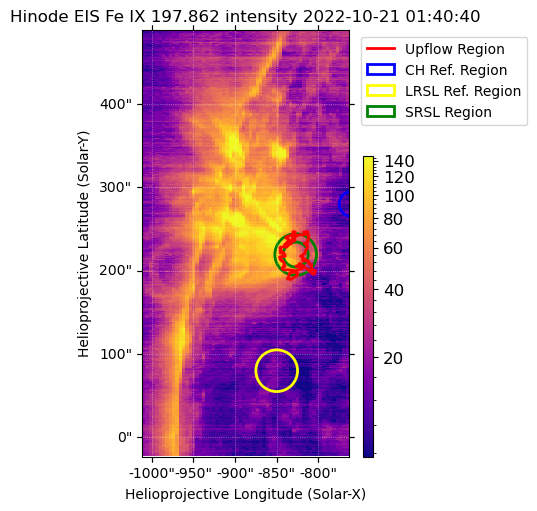

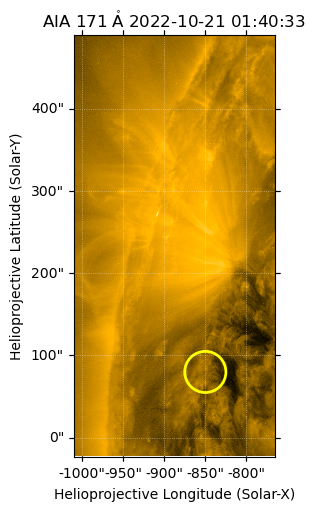

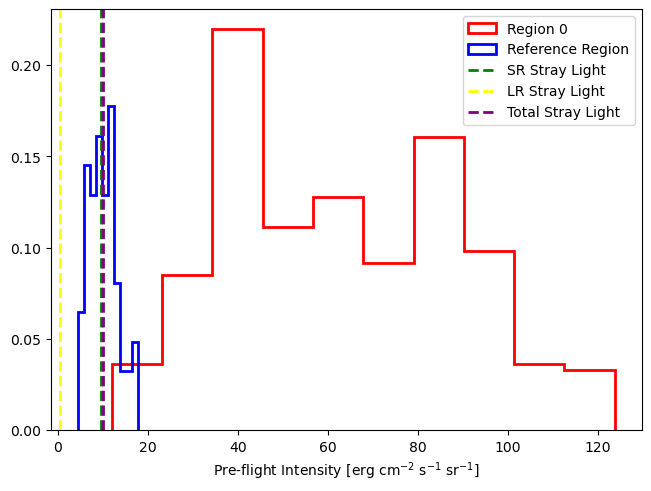

In [27]:
eis_FeIX_197_upflow_regions_int_mean_radcal, \
eis_FeIX_197_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_09_197_862.1c-0', cs_regions,
                                                                                 reference_region_params=coronal_hole_ref_region_params,                
                                                                                  short_range_stray_light=True, 
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_171_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_10_184_536.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


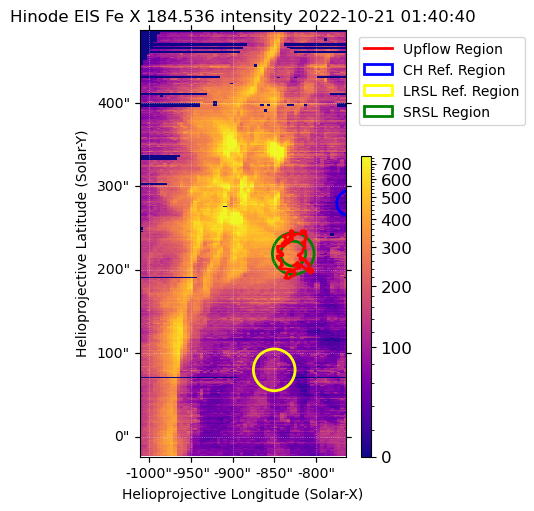

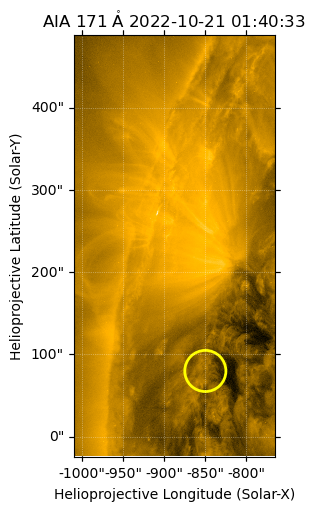

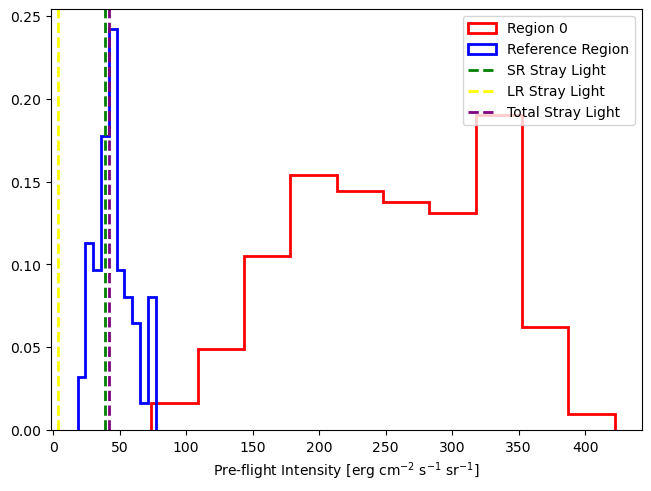

In [28]:
eis_FeX_184_upflow_regions_int_mean_radcal, \
eis_FeX_184_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_10_184_536.1c-0', cs_regions,
                                                                                reference_region_params=coronal_hole_ref_region_params,         
                                                                                short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_171_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_11_188_216.2c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


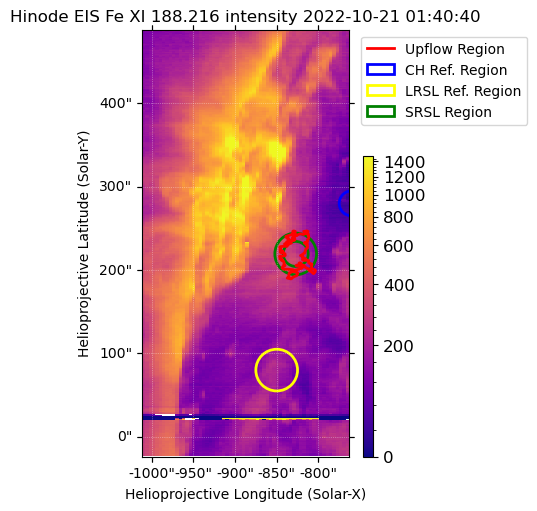

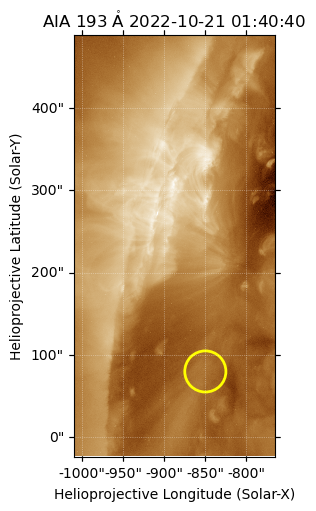

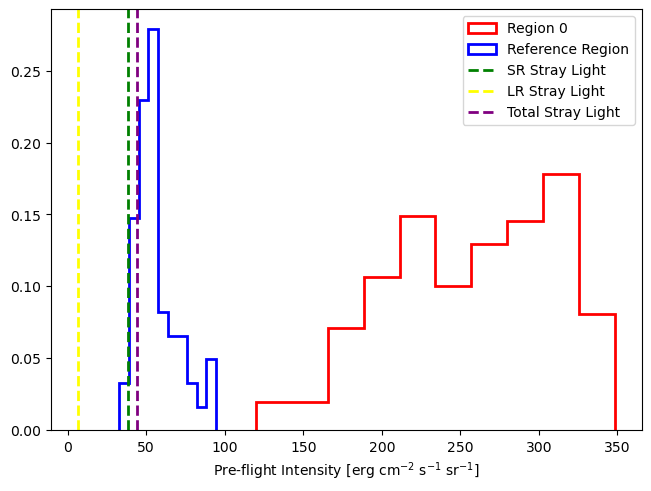

In [29]:
eis_FeXI_188_216_upflow_regions_int_mean_radcal, \
eis_FeXI_188_216_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_11_188_216.2c-0', cs_regions,
                                                                                     reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_11_188_299.2c-1.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


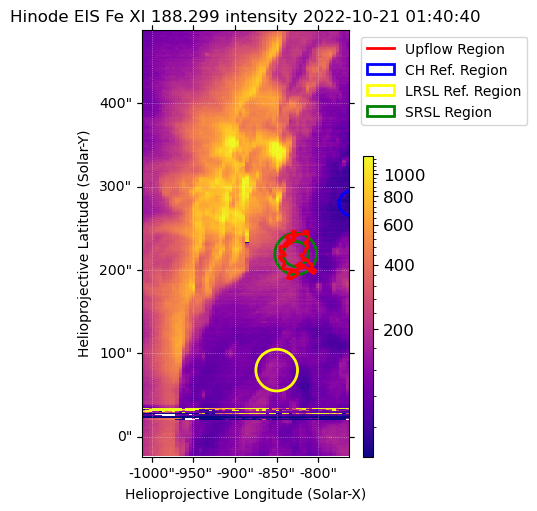

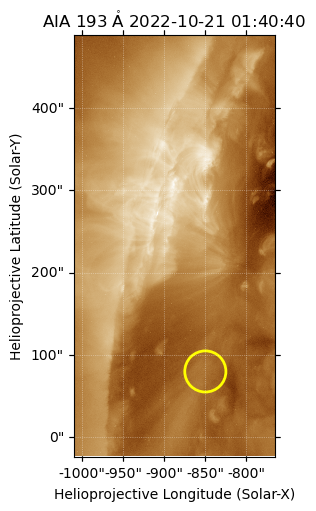

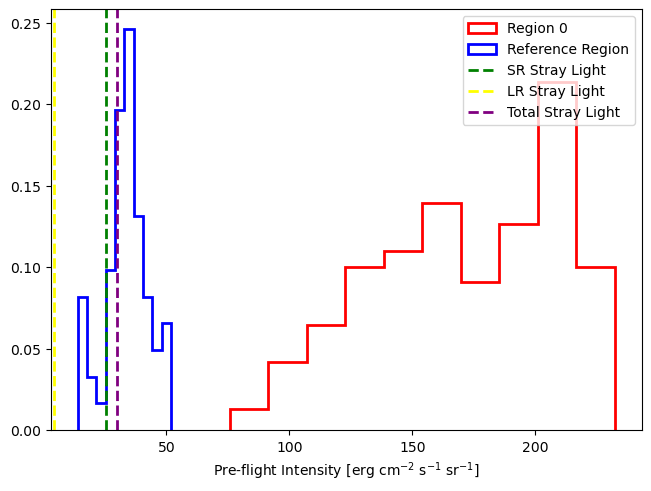

In [30]:
eis_FeXI_188_299_upflow_regions_int_mean_radcal, \
eis_FeXI_188_299_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_11_188_299.2c-1', cs_regions,
                                                                                     component=1,
                                                                                     reference_region_params=coronal_hole_ref_region_params,  
                                                                                     short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_12_192_394.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


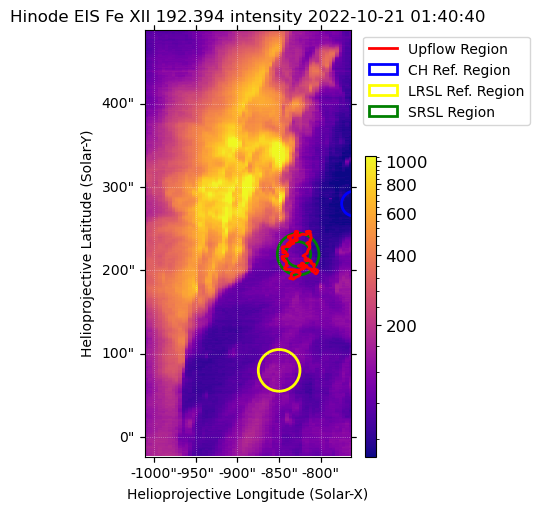

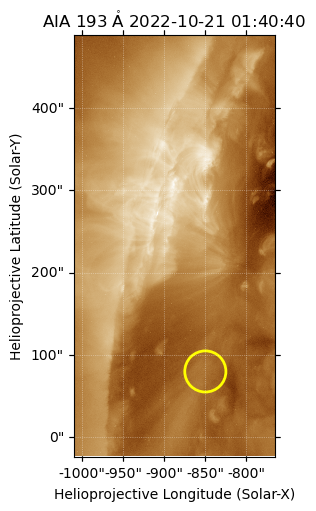

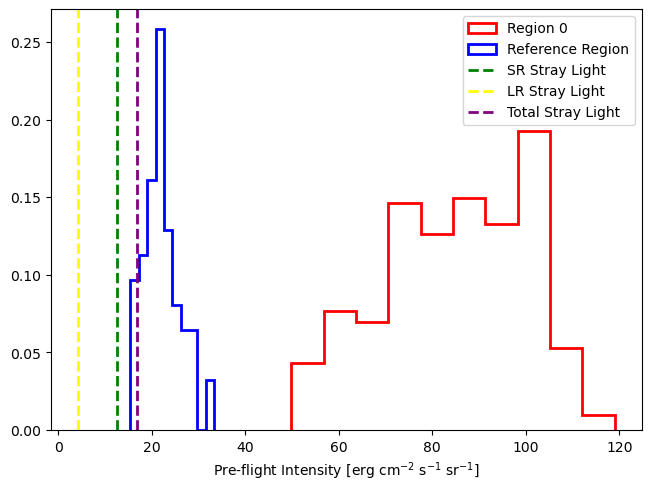

In [31]:
eis_FeXII_192_upflow_regions_int_mean_radcal, \
eis_FeXII_192_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_12_192_394.1c-0', cs_regions,
                                                                                  reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_12_195_119.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


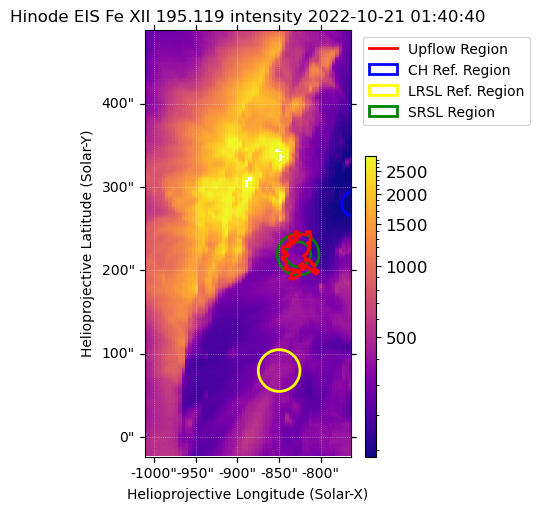

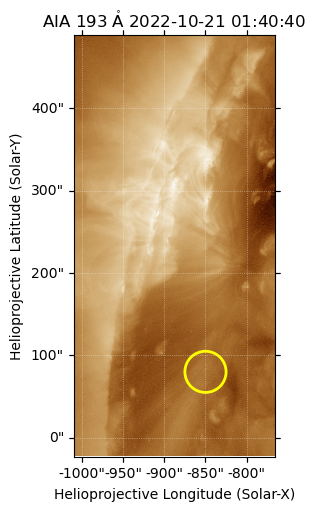

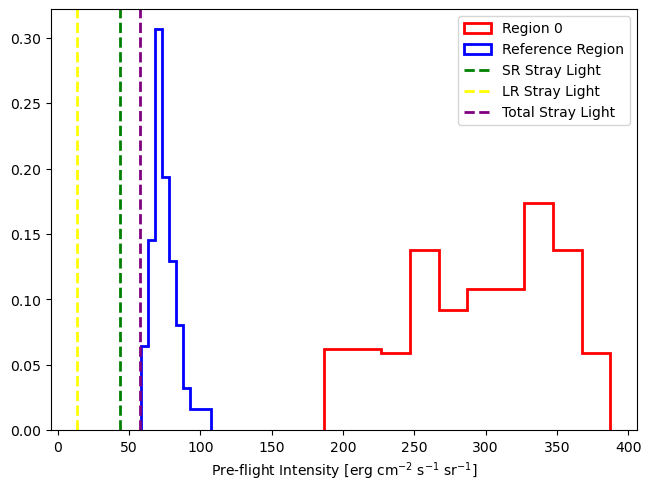

In [32]:
eis_FeXII_195_upflow_regions_int_mean_radcal, \
eis_FeXII_195_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_12_195_119.1c-0', cs_regions,
                                                                                    reference_region_params=coronal_hole_ref_region_params,         
                                                                                        short_range_stray_light=True,
                                                                                     long_range_stray_light=True,
                                                                                     long_range_stray_light_aia_ref=aia_193_map,
                                                                                     long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                     long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_13_202_044.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


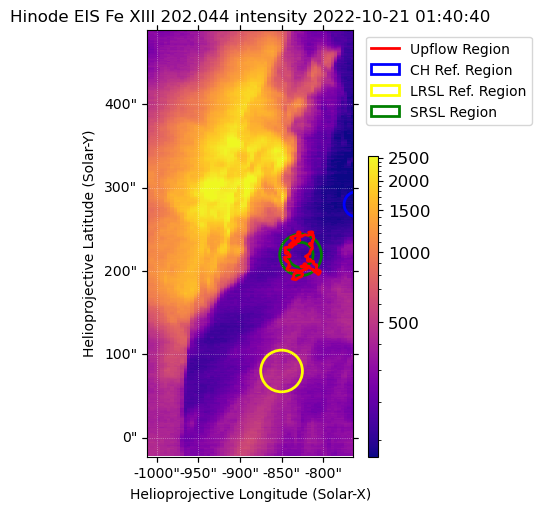

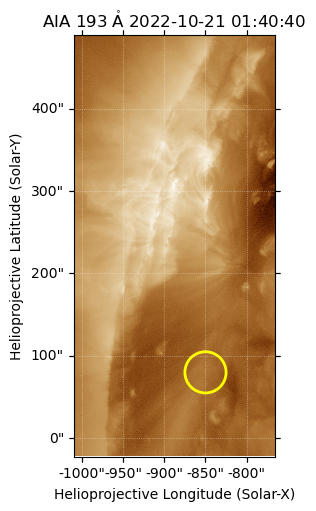

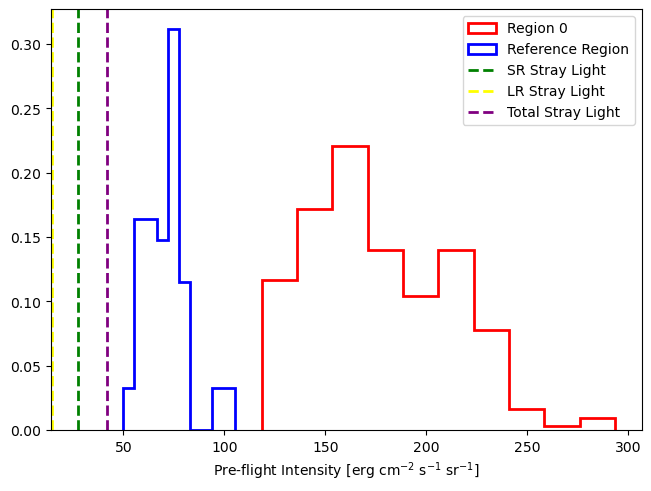

In [33]:
eis_FeXIII_202_upflow_regions_int_mean_radcal, \
eis_FeXIII_202_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_13_202_044.1c-0', cs_regions,
                                                                                   reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_12_203_720.2c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


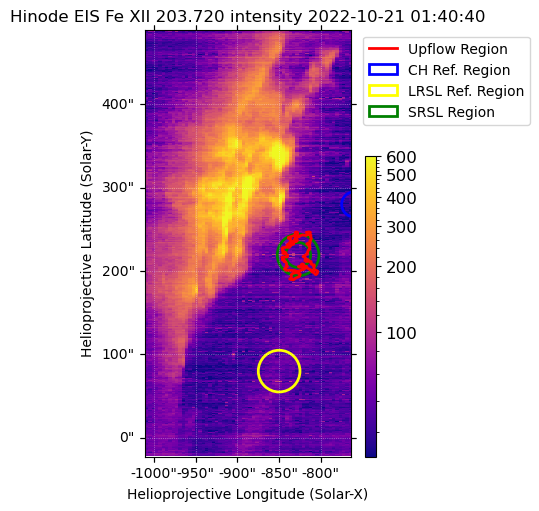

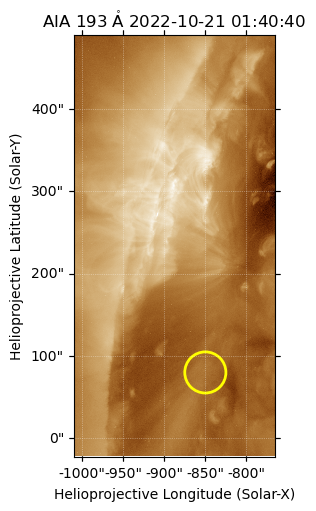

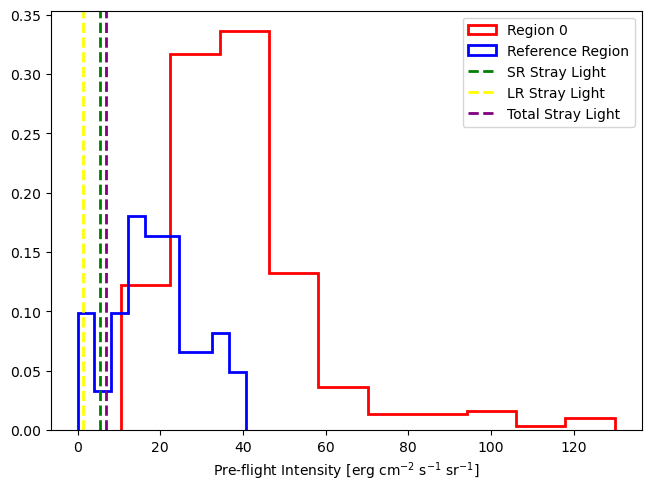

In [34]:
eis_FeXII_203_720_upflow_regions_int_mean_radcal, \
eis_FeXII_203_720_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_12_203_720.2c-0', cs_regions,
                                                                                      reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_13_203_826.2c-1.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


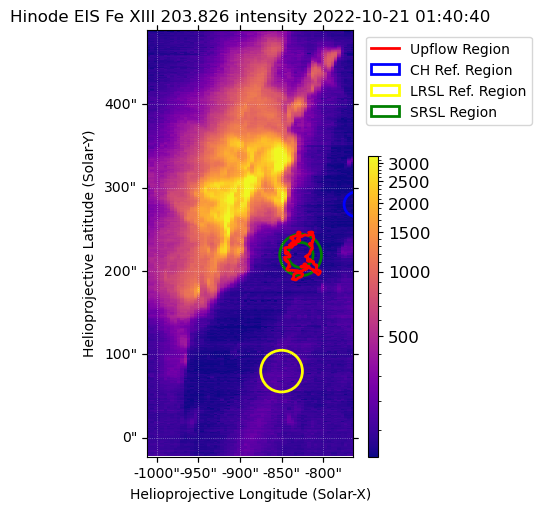

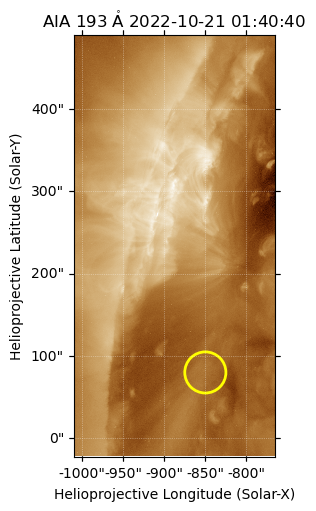

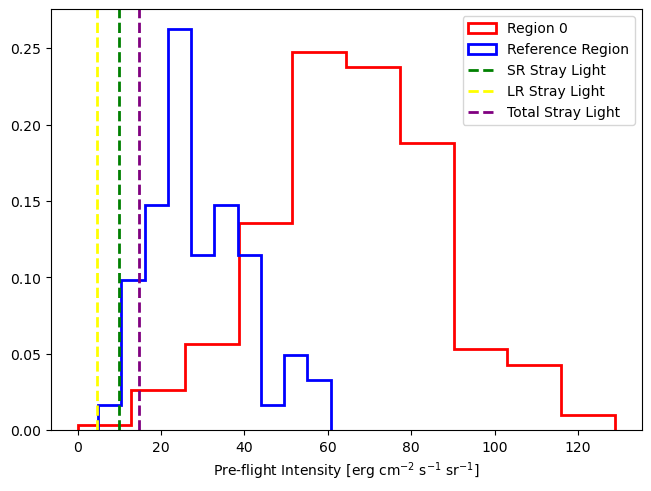

In [35]:
eis_FeXIII_203_826_upflow_regions_int_mean_radcal, \
eis_FeXIII_203_826_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_13_203_826.2c-1', cs_regions,
                                                                                       component=1,
                                                                                       reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_14_264_787.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


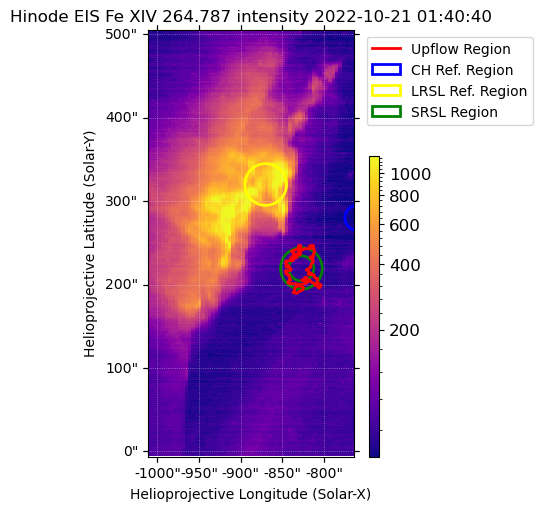

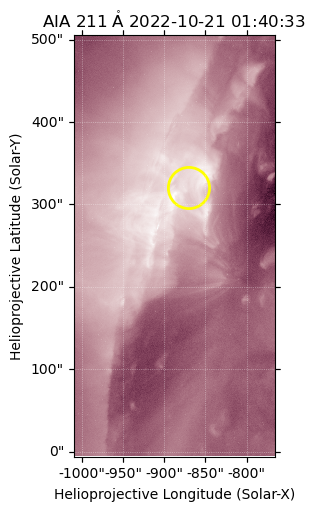

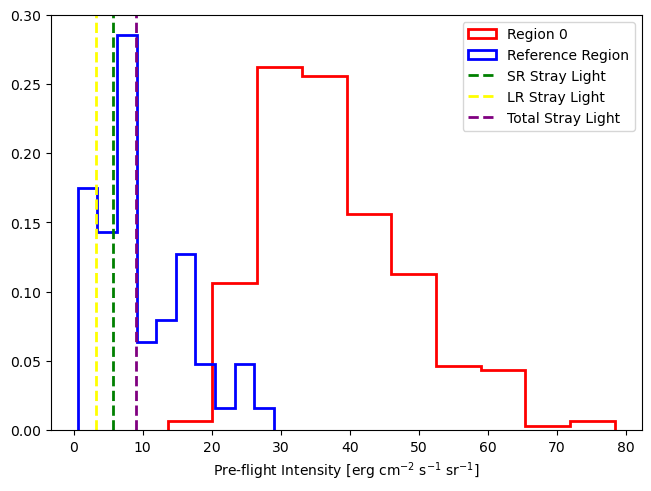

In [36]:
eis_FeXIV_264_upflow_regions_int_mean_radcal, \
eis_FeXIV_264_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_14_264_787.1c-0', cs_regions,
                                                                                  int_hist=0,
                                                                                  reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_211_map,
                                                                                   long_range_stray_light_ref_center=[-870,320]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_14_270_519.2c-1.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


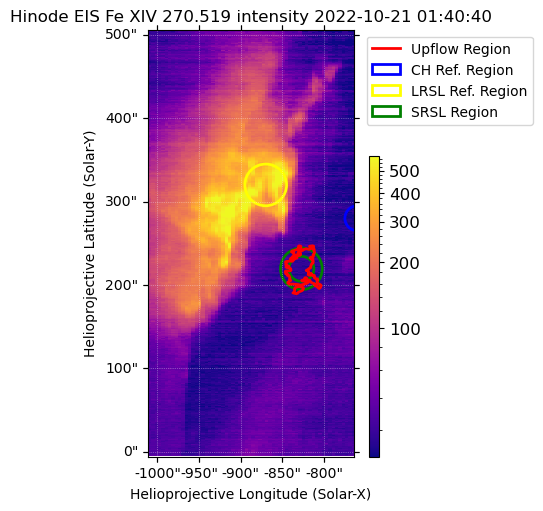

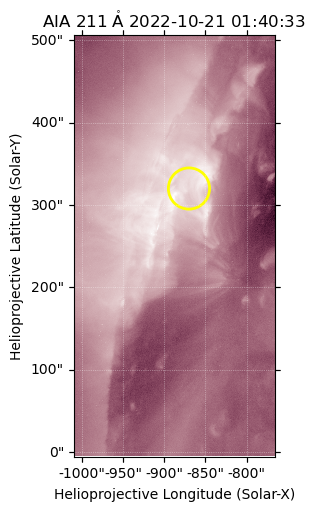

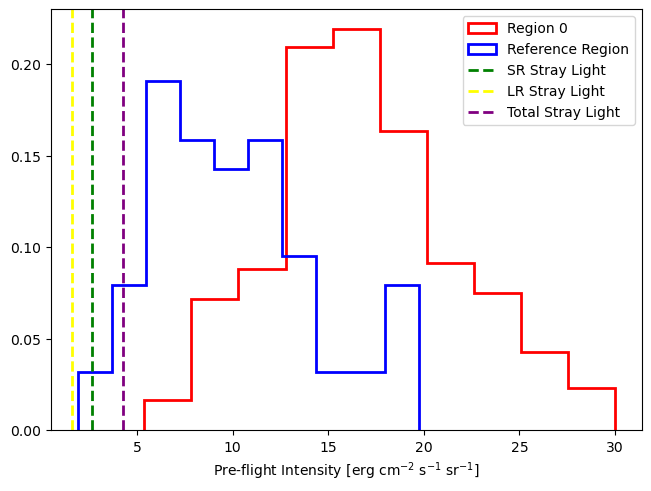

In [37]:
eis_FeXIV_270_upflow_regions_int_mean_radcal, \
eis_FeXIV_270_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_14_270_519.2c-1', cs_regions,
                                                                                  component=1,int_hist=0,
                                                                                  reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_211_map,
                                                                                   long_range_stray_light_ref_center=[-870,320]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_15_284_160.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


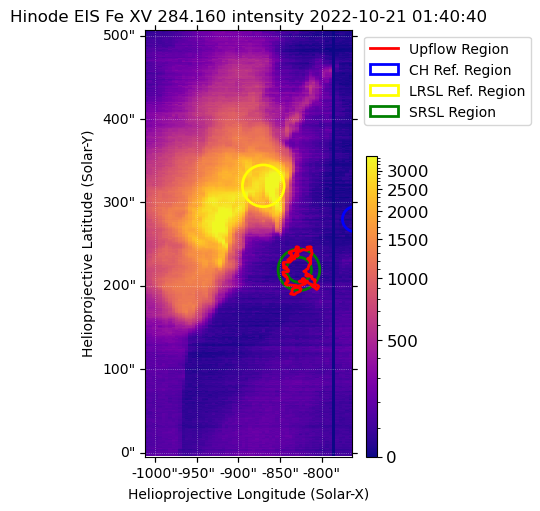

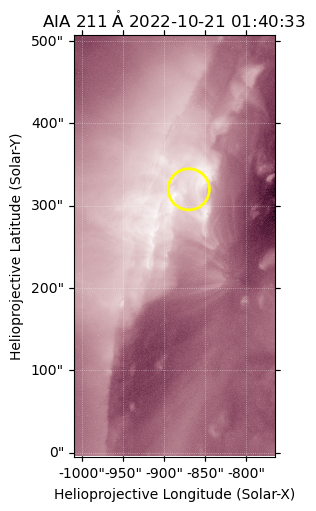

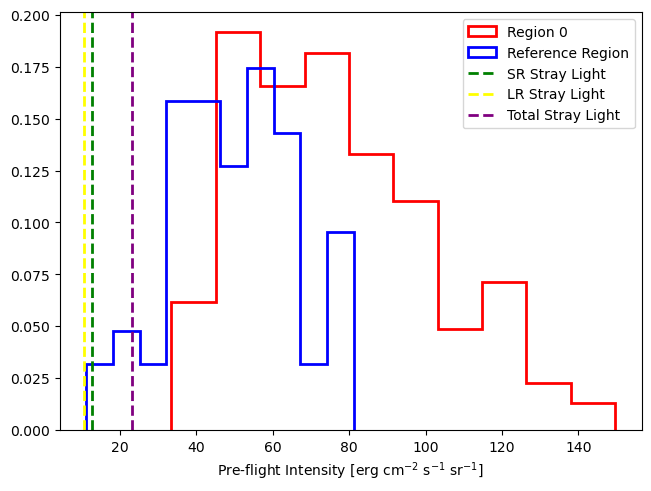

In [38]:
eis_FeXV_284_upflow_regions_int_mean_radcal, \
eis_FeXV_284_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_15_284_160.1c-0', cs_regions,
                                                                                 int_hist=0,
                                                                                 reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_211_map,
                                                                                   long_range_stray_light_ref_center=[-870,320]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.fe_16_262_984.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


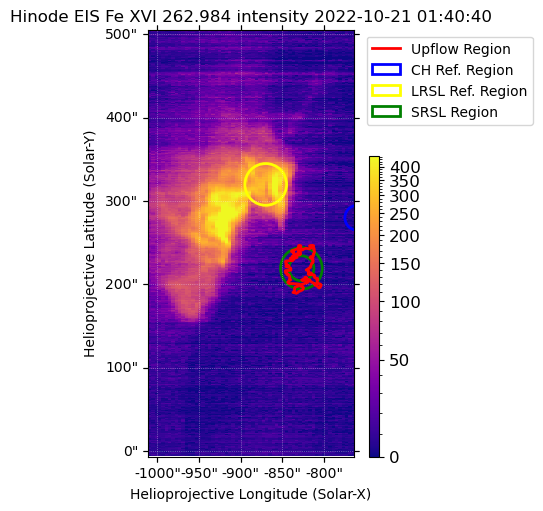

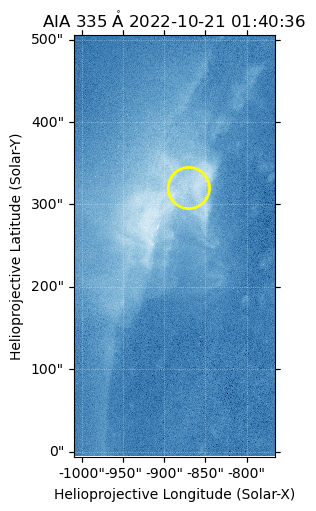

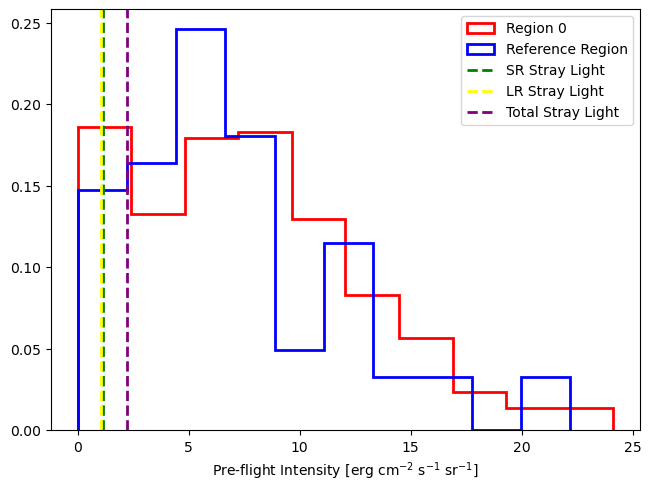

In [39]:
eis_FeXVI_262_upflow_regions_int_mean_radcal, \
eis_FeXVI_262_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'fe_16_262_984.1c-0', cs_regions,
                                                                                  reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_335_map,
                                                                                   long_range_stray_light_ref_center=[-870,320]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.o__04_279_933.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


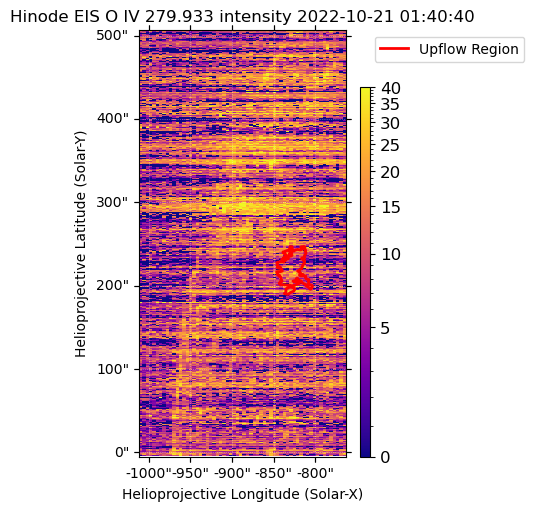

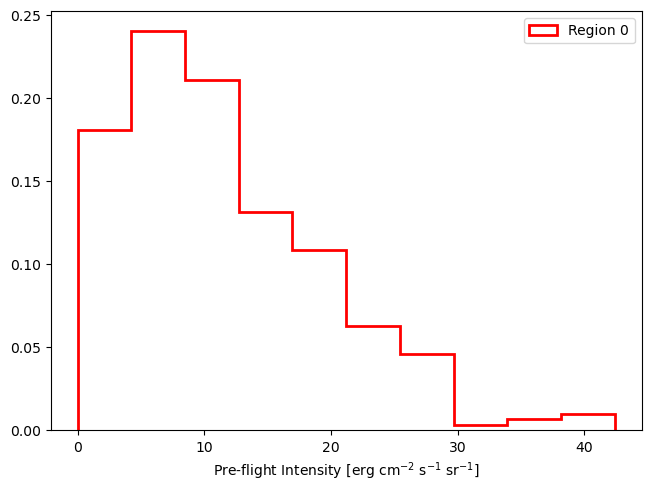

In [40]:
eis_OIV_279_upflow_regions_int_mean_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'o__04_279_933.1c-0', cs_regions)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.o__06_184_117.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


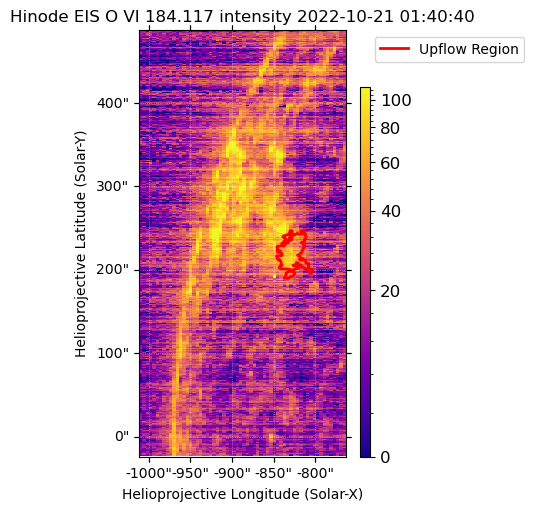

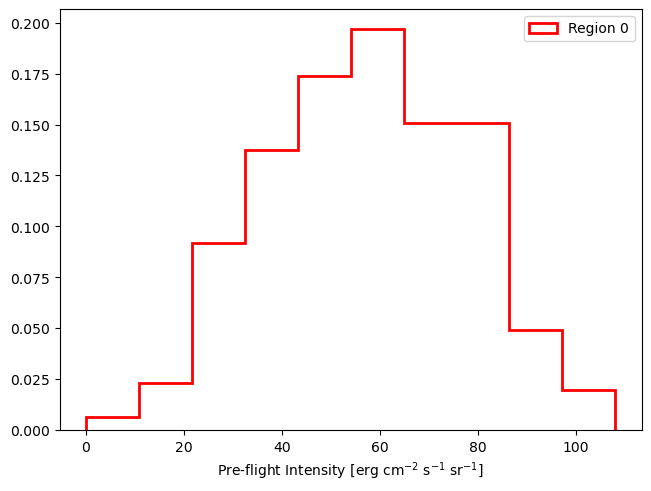

In [41]:
eis_OVI_184_upflow_regions_int_mean_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'o__06_184_117.1c-0', cs_regions,
                                                                                )

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.mg_06_270_394.2c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


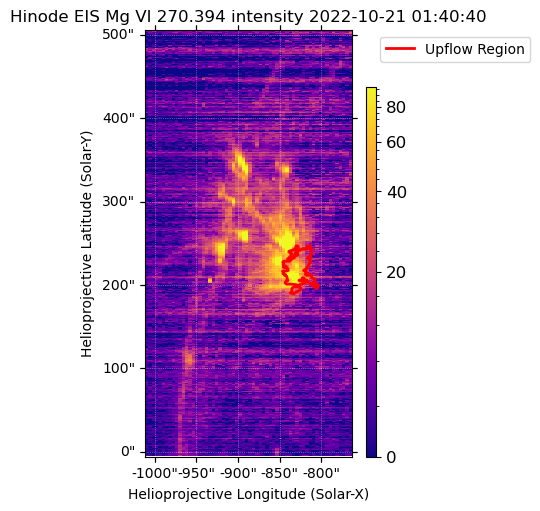

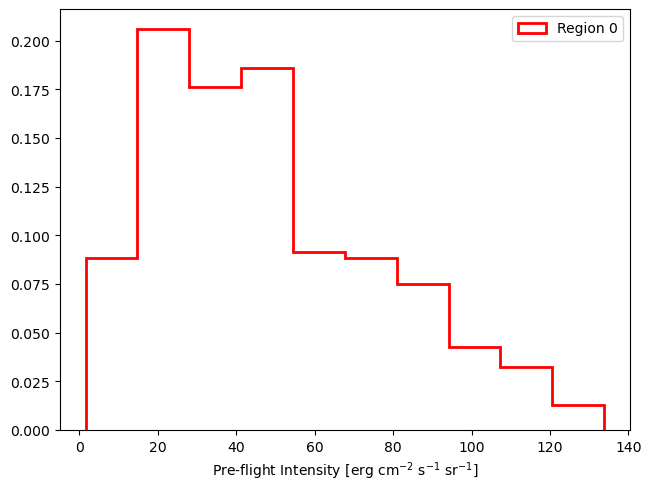

In [42]:
eis_MgVI_270_upflow_regions_int_mean_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'mg_06_270_394.2c-0', cs_regions)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.si_07_275_368.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


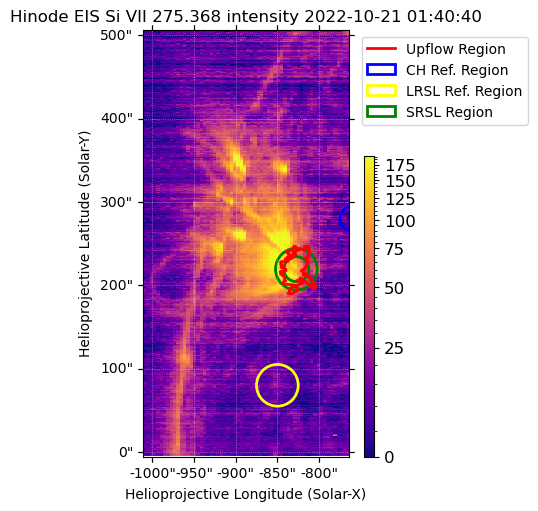

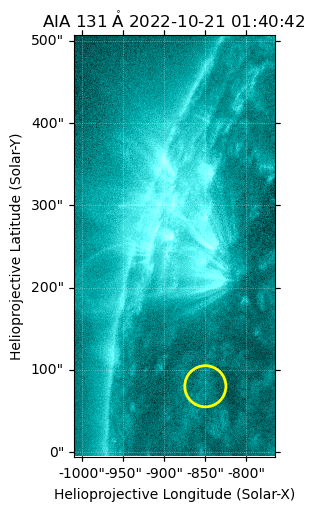

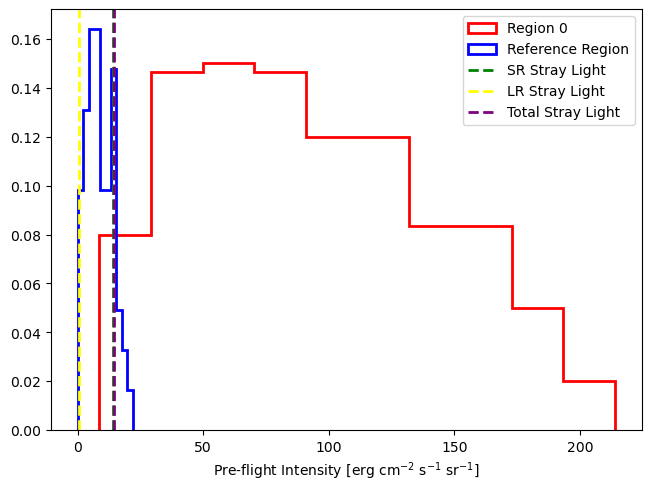

In [43]:
eis_SiVII_275_upflow_regions_int_mean_radcal, \
eis_SiVII_275_upflow_regions_stray_light_int_radcal= read_eis_fit_and_return_upflow_int(eis_file_prefix, 'si_07_275_368.1c-0', cs_regions,
                                                                                  reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_131_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.mg_07_276_153.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


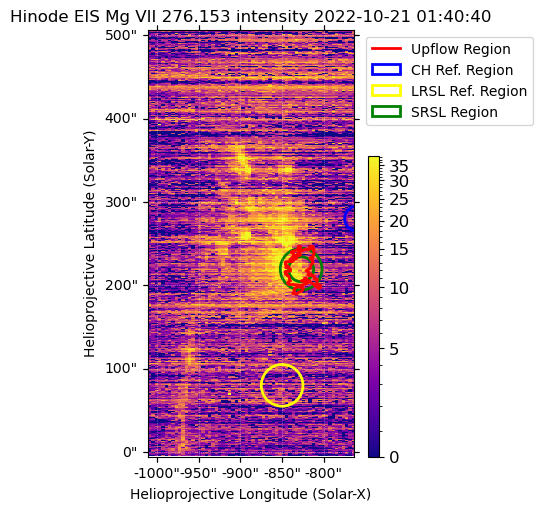

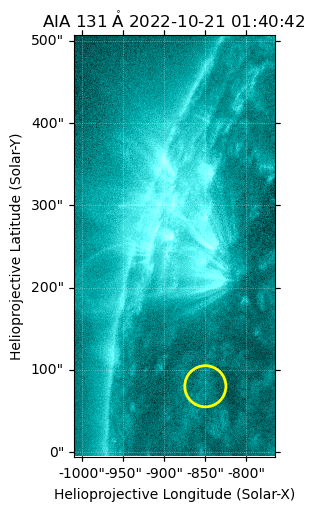

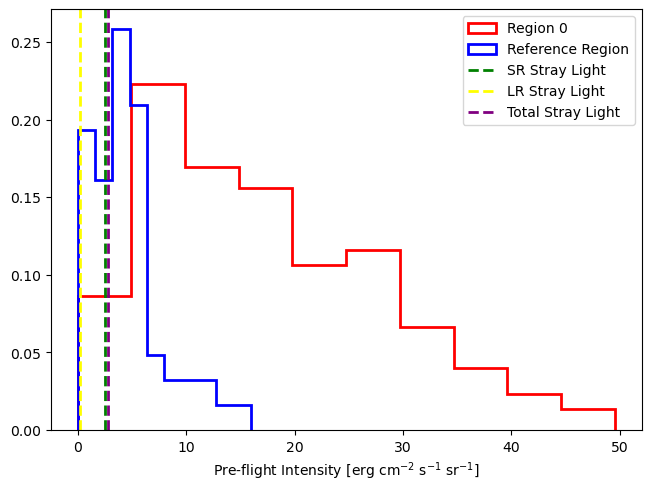

In [44]:
eis_MgVII_276_upflow_regions_int_mean_radcal, \
eis_MgVII_276_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'mg_07_276_153.1c-0', cs_regions,
                                                                                  reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_131_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.mg_07_280_737.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


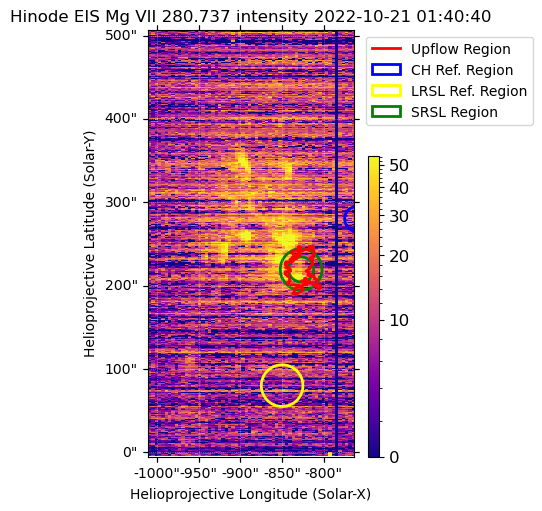

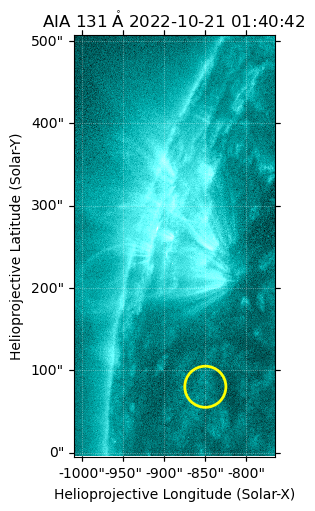

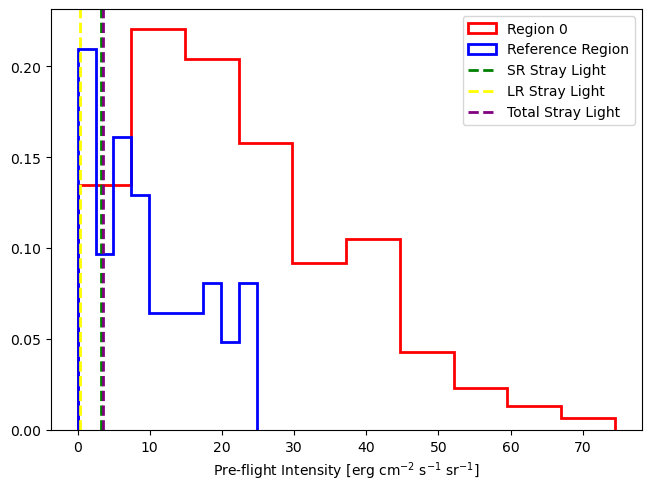

In [45]:
eis_MgVII_280_upflow_regions_int_mean_radcal, \
eis_MgVII_280_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'mg_07_280_737.1c-0', cs_regions,
                                                                                  reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_131_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.si_10_258_375.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


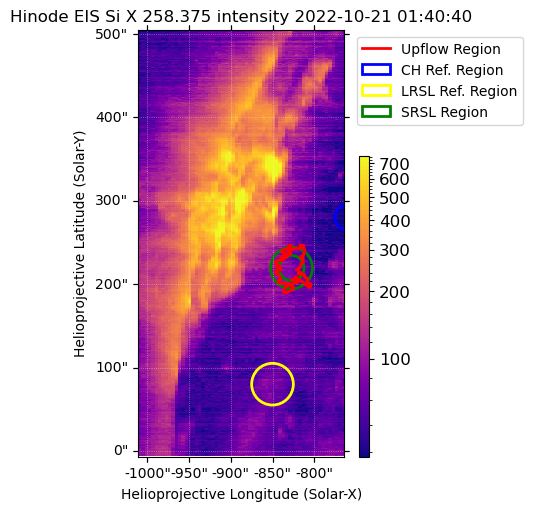

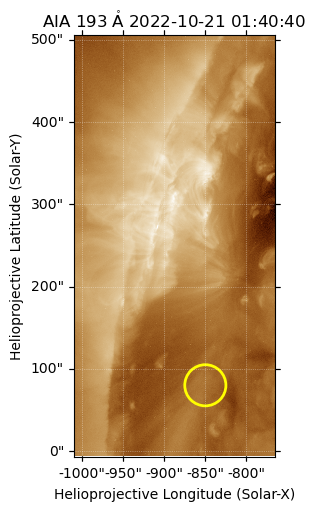

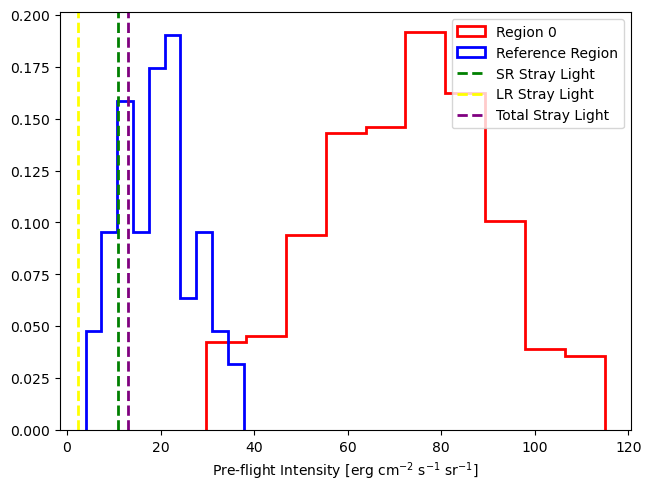

In [46]:
eis_SiX_258_upflow_regions_int_mean_radcal, \
eis_SiX_258_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'si_10_258_375.1c-0', cs_regions,
                                                                                reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

Reading fit result from, 
   ../../src/EIS/DHB_007_v2/20221020T2343/eis_20221021_010842.si_10_261_058.1c-0.fit.h5
INFO: uncertainty should have attribute uncertainty_type. [astropy.nddata.nddata]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]
INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


/tmp/ipykernel_375380/3029816634.py:7: UserWarning: Adding colorbar to a different Figure <Figure size 700x500 with 2 Axes> than <Figure size 640x480 with 1 Axes> which fig.colorbar is called on.
  clb = plt.colorbar(im,pad = 0.05,orientation=orientation,ax=ax,cax=clb_ax)


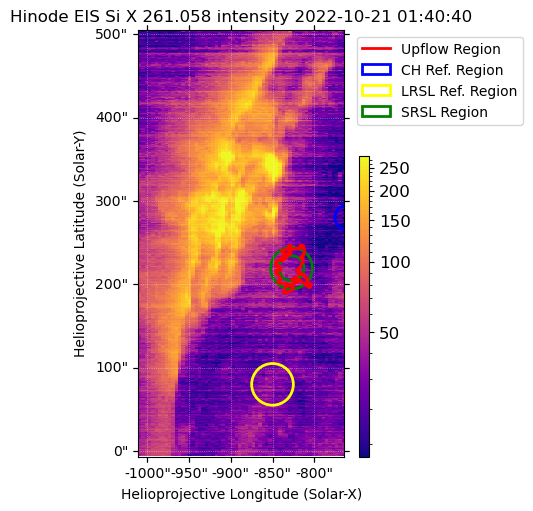

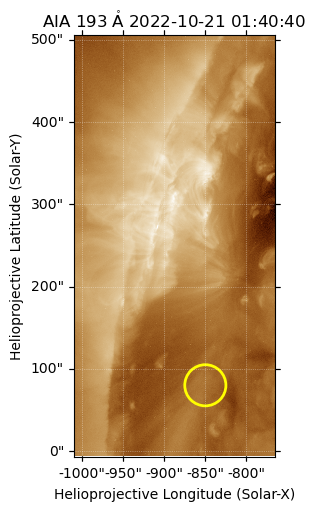

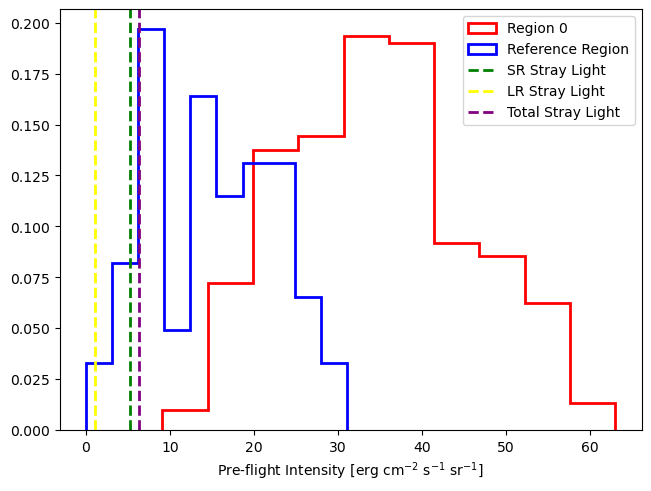

In [47]:
eis_SiX_261_upflow_regions_int_mean_radcal, \
eis_SiX_261_upflow_regions_stray_light_int_radcal = read_eis_fit_and_return_upflow_int(eis_file_prefix, 'si_10_261_058.1c-0', cs_regions,
                                                                                reference_region_params=coronal_hole_ref_region_params,         
                                                                                    short_range_stray_light=True,
                                                                                   long_range_stray_light=True,
                                                                                   long_range_stray_light_aia_ref=aia_193_map,
                                                                                   long_range_stray_light_ref_center=[-850,80]*u.arcsec,
                                                                                   long_range_stray_light_ref_radius=50*u.arcsec)

In [48]:
def dens_diag(ratio, chianti_file):
    chianti_pf = pd.read_csv(chianti_file,skiprows=6,sep=r'\s+',names=['dens','ratio'])
    chianti_dens, chianti_ratio = chianti_pf['dens'], chianti_pf['ratio']
    if np.all(np.diff(chianti_ratio) < 0):
        chianti_ratio = chianti_ratio[::-1]
        chianti_dens = chianti_dens[::-1]

    dens_interp_func = scipy.interpolate.interp1d(chianti_ratio, chianti_dens, kind='linear', fill_value='extrapolate')

    return dens_interp_func(ratio)

In [49]:
SiX_dens_upflow_regions = dens_diag(eis_SiX_258_upflow_regions_int_mean_radcal/eis_SiX_261_upflow_regions_int_mean_radcal,
                                    '../../sav/CHIANTI/SiX_258_261_dens.txt')
SiX_dens_upflow_regions

array([1.5595887e+08])

In [50]:
SiX_dens_upflow_regions_sl_removed = dens_diag((eis_SiX_258_upflow_regions_int_mean_radcal - eis_SiX_258_upflow_regions_stray_light_int_radcal[:,1])/
                                               (eis_SiX_261_upflow_regions_int_mean_radcal - eis_SiX_261_upflow_regions_stray_light_int_radcal[:,1]),
                                               '../../sav/CHIANTI/SiX_258_261_dens.txt')
SiX_dens_upflow_regions_sl_removed

array([1.54924667e+08])

In [51]:
MgVII_dens_upflow_regions = dens_diag(eis_MgVII_276_upflow_regions_int_mean_radcal/eis_MgVII_280_upflow_regions_int_mean_radcal,
                                        '../../sav/CHIANTI/MgVII_276_280.txt')
MgVII_dens_upflow_regions

array([9.57893847e+08])

In [52]:
FeXIII_dens_upflow_regions = dens_diag(eis_FeXIII_202_upflow_regions_int_mean_radcal/eis_FeXIII_203_826_upflow_regions_int_mean_radcal,
                                        '../../sav/CHIANTI/FeXIII_202_203_dens.txt')
FeXIII_dens_upflow_regions

array([1.95085739e+08])

In [53]:
FeXIII_dens_upflow_regions_sl_removed = dens_diag((eis_FeXIII_202_upflow_regions_int_mean_radcal - np.nansum(eis_FeXIII_202_upflow_regions_stray_light_int_radcal,axis=1))/
                                                    (eis_FeXIII_203_826_upflow_regions_int_mean_radcal - np.nansum(eis_FeXIII_203_826_upflow_regions_stray_light_int_radcal,axis=1)),
                                                    '../../sav/CHIANTI/FeXIII_202_203_dens.txt')
FeXIII_dens_upflow_regions_sl_removed

array([2.02118638e+08])

In [54]:
upflow_region_0_dem_wvl = np.array([185.213, 186.598, 188.493, 197.854, 184.537,
                                    188.216, 188.299, 192.394, 195.119, 203.728,
                                    202.044, 203.826, 264.788, 270.520, 284.163, 
                                    262.976])
upflow_region_0_dem_int = np.vstack([eis_FeVIII_185_upflow_regions_int_mean_radcal,
                                     eis_FeVIII_186_upflow_regions_int_mean_radcal,
                                     eis_FeIX_188_upflow_regions_int_mean_radcal,
                                     eis_FeIX_197_upflow_regions_int_mean_radcal,
                                     eis_FeX_184_upflow_regions_int_mean_radcal,
                                     eis_FeXI_188_216_upflow_regions_int_mean_radcal,
                                     eis_FeXI_188_299_upflow_regions_int_mean_radcal,
                                     eis_FeXII_192_upflow_regions_int_mean_radcal,
                                     eis_FeXII_195_upflow_regions_int_mean_radcal,
                                     eis_FeXII_203_720_upflow_regions_int_mean_radcal,
                                     eis_FeXIII_202_upflow_regions_int_mean_radcal,
                                     eis_FeXIII_203_826_upflow_regions_int_mean_radcal,
                                     eis_FeXIV_264_upflow_regions_int_mean_radcal,
                                     eis_FeXIV_270_upflow_regions_int_mean_radcal,
                                     eis_FeXV_284_upflow_regions_int_mean_radcal,
                                     eis_FeXVI_262_upflow_regions_int_mean_radcal])[:,0]

upflow_region_0_dem_int_err = upflow_region_0_dem_int*0.23

upflow_region_0_den_wvl_hwhm = np.ones_like(upflow_region_0_dem_wvl)*0.05

upflow_region_0_dem_des = ['Fe VIII 185', 'Fe VIII 186', 'Fe IX 188', 'Fe IX 197', 'Fe X 184',
                           'Fe XI 188.216', 'Fe XI 188.299', 'Fe XII 192', 'Fe XII 195', 'Fe XII 203.720',
                           'Fe XIII 202', 'Fe XIII 203.826/.795', 'Fe XIV 264', 'Fe XIV 270', 'Fe XV 284',
                           'Fe XVI 262']


In [55]:
upflow_region_0_chianti_input_pf = pd.DataFrame({'wvl':upflow_region_0_dem_wvl,
                                                    'int':upflow_region_0_dem_int,
                                                    'int_err':upflow_region_0_dem_int_err,
                                                    'hwhm':upflow_region_0_den_wvl_hwhm,
                                                    'des':upflow_region_0_dem_des})
upflow_region_0_chianti_input_pf.to_csv('../../sav/CHIANTI/dem_input/west_upflow_region_0_chianti_input_pf.txt',index=False,
                                        header=False, sep=' ',)
upflow_region_0_chianti_input_pf

,wvl,int,int_err,hwhm,des
0,185.213,446.662604,102.732399,0.05,Fe VIII 185
1,186.598,292.345427,67.239448,0.05,Fe VIII 186
2,188.493,104.958438,24.140441,0.05,Fe IX 188
3,197.854,66.514117,15.298247,0.05,Fe IX 197
4,184.537,352.128559,80.989569,0.05,Fe X 184
5,188.216,271.170370,62.369185,0.05,Fe XI 188.216
6,188.299,179.591870,41.306130,0.05,Fe XI 188.299
7,192.394,77.181085,17.751650,0.05,Fe XII 192
8,195.119,289.061131,66.484060,0.05,Fe XII 195
9,203.728,18.885735,4.343719,0.05,Fe XII 203.720


In [56]:
upflow_region_0_dem_int_sr_removed = \
    np.array([eis_FeVIII_185_upflow_regions_int_mean_radcal[0],
              eis_FeVIII_186_upflow_regions_int_mean_radcal[0],
              eis_FeIX_188_upflow_regions_int_mean_radcal[0],
              eis_FeIX_197_upflow_regions_int_mean_radcal[0],
              eis_FeX_184_upflow_regions_int_mean_radcal[0],
              eis_FeXI_188_216_upflow_regions_int_mean_radcal[0],
              eis_FeXI_188_299_upflow_regions_int_mean_radcal[0],
              eis_FeXII_192_upflow_regions_int_mean_radcal[0] - eis_FeXII_192_upflow_regions_stray_light_int_radcal[0,1],
              eis_FeXII_195_upflow_regions_int_mean_radcal[0] - eis_FeXII_195_upflow_regions_stray_light_int_radcal[0,1],
              eis_FeXII_203_720_upflow_regions_int_mean_radcal[0] - eis_FeXII_203_720_upflow_regions_stray_light_int_radcal[0,1],
              eis_FeXIII_202_upflow_regions_int_mean_radcal[0] - np.nansum(eis_FeXIII_202_upflow_regions_stray_light_int_radcal[0,:]),
              eis_FeXIII_203_826_upflow_regions_int_mean_radcal[0] - np.nansum(eis_FeXIII_203_826_upflow_regions_stray_light_int_radcal[0,:]),
              eis_FeXIV_264_upflow_regions_int_mean_radcal[0] - np.nansum(eis_FeXIV_264_upflow_regions_stray_light_int_radcal[0,:]),
              eis_FeXIV_270_upflow_regions_int_mean_radcal[0] - np.nansum(eis_FeXIV_270_upflow_regions_stray_light_int_radcal[0,:]),
              eis_FeXV_284_upflow_regions_int_mean_radcal[0] - np.nansum(eis_FeXV_284_upflow_regions_stray_light_int_radcal[0,:]),
              eis_FeXVI_262_upflow_regions_int_mean_radcal[0] - np.nansum(eis_FeXVI_262_upflow_regions_stray_light_int_radcal[0,:])])

upflow_region_0_dem_int_sr_removed_err = upflow_region_0_dem_int_sr_removed*0.23


In [57]:
upflow_region_0_chianti_input_pf_sr_removed = pd.DataFrame({'wvl':upflow_region_0_dem_wvl,
                                                    'int':upflow_region_0_dem_int_sr_removed,
                                                    'int_err':upflow_region_0_dem_int_sr_removed_err,
                                                    'hwhm':upflow_region_0_den_wvl_hwhm,
                                                    'des':upflow_region_0_dem_des})
upflow_region_0_chianti_input_pf_sr_removed.to_csv('../../sav/CHIANTI/dem_input/west_upflow_region_0_chianti_input_pf_sr_removed.txt',index=False,
                                        header=False, sep=' ',)
upflow_region_0_chianti_input_pf_sr_removed

,wvl,int,int_err,hwhm,des
0,185.213,446.662604,102.732399,0.05,Fe VIII 185
1,186.598,292.345427,67.239448,0.05,Fe VIII 186
2,188.493,104.958438,24.140441,0.05,Fe IX 188
3,197.854,66.514117,15.298247,0.05,Fe IX 197
4,184.537,352.128559,80.989569,0.05,Fe X 184
5,188.216,271.170370,62.369185,0.05,Fe XI 188.216
6,188.299,179.591870,41.306130,0.05,Fe XI 188.299
7,192.394,73.439837,16.891162,0.05,Fe XII 192
8,195.119,275.591873,63.386131,0.05,Fe XII 195
9,203.728,18.210078,4.188318,0.05,Fe XII 203.720


In [58]:
dem_xrt_output_test = readsav('../../sav/CHIANTI/dem_output/west_upflow_region_0_sr_removed/west_upflow_region_0_chianti_output_xrt_dem.save',
                          verbose=True)

IDL Save file is compressed
 -> expanding to /tmp/tmpvtigv2az.sav
--------------------------------------------------
Date: Wed Jul 10 16:48:39 2024
User: yjzhu
Host: Yingjies-MacBook-Pro.local
--------------------------------------------------
Format: 11
Architecture: x86_64
Operating System: darwin
IDL Version: 8.2
--------------------------------------------------
Successfully read 12 records of which:
 - 9 are of type VARIABLE
 - 1 are of type TIMESTAMP
 - 1 are of type VERSION
--------------------------------------------------
Available variables:
 - logt_out [<class 'numpy.ndarray'>]
 - log_dem_mciter [<class 'numpy.ndarray'>]
 - obs_int [<class 'numpy.ndarray'>]
 - obs_sig [<class 'numpy.ndarray'>]
 - obs_id [<class 'numpy.ndarray'>]
 - obs_wvl [<class 'numpy.ndarray'>]
 - exp_int [<class 'numpy.ndarray'>]
 - t_eff [<class 'numpy.ndarray'>]
 - temp_max_tot_contr [<class 'numpy.ndarray'>]
--------------------------------------------------


In [59]:
dem_mpfit_output_test = readsav('../../sav/CHIANTI/dem_output/west_upflow_region_0_sr_removed/west_upflow_region_0_chianti_output_mpfit_dem.save',
                          verbose=True)

IDL Save file is compressed
 -> expanding to /tmp/tmpzu_bw18i.sav
--------------------------------------------------
Date: Wed Jul 10 16:43:58 2024
User: yjzhu
Host: Yingjies-MacBook-Pro.local
--------------------------------------------------
Format: 11
Architecture: x86_64
Operating System: darwin
IDL Version: 8.2
--------------------------------------------------
Successfully read 13 records of which:
 - 10 are of type VARIABLE
 - 1 are of type TIMESTAMP
 - 1 are of type VERSION
--------------------------------------------------
Available variables:
 - ch_tot_contr_interpolated [<class 'numpy.ndarray'>]
 - logt_interpolated [<class 'numpy.ndarray'>]
 - logt_out [<class 'numpy.ndarray'>]
 - log_dem_out [<class 'numpy.ndarray'>]
 - obs_int [<class 'numpy.ndarray'>]
 - obs_id [<class 'numpy.ndarray'>]
 - obs_wvl [<class 'numpy.ndarray'>]
 - exp_int [<class 'numpy.ndarray'>]
 - t_eff [<class 'numpy.ndarray'>]
 - temp_max_tot_contr [<class 'numpy.ndarray'>]
------------------------------

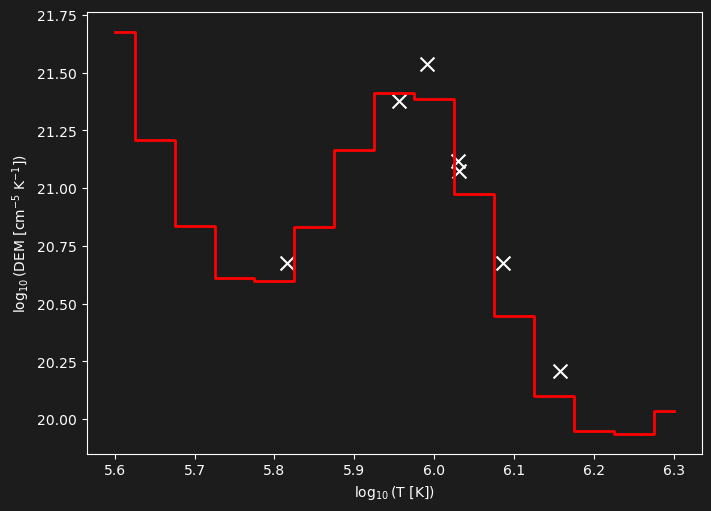

In [60]:
with plt.style.context('dark_background'):
    fig = plt.figure(figsize=(7, 5),layout='constrained', facecolor='#1C1C1C')
    ax = fig.add_subplot(111, facecolor='#1C1C1C')

    ax.step(dem_mpfit_output_test['logt_out'], dem_mpfit_output_test['log_dem_out'], where='mid', color='red', lw=2,)

    for teff, exp_int, obs_int, line_id in zip(dem_mpfit_output_test['t_eff'], 
                                               dem_mpfit_output_test['exp_int'],
                                               dem_mpfit_output_test['obs_int'],
                                               dem_mpfit_output_test['obs_id']):
        
        # print(np.log10(teff), exp_int/obs_int, line_id.decode("utf-8"))

        # ax.text(np.log10(teff), exp_int/obs_int*np.interp(np.log10(teff), dem_mpfit_output_test['logt_out'], dem_mpfit_output_test['log_dem_out']),
        #          line_id.decode("utf-8")[1:-1], color='white', fontsize=12, ha='center', va='bottom',rotation=90) 
        
        ax.scatter(np.log10(teff), np.log10(obs_int/exp_int)+np.interp(np.log10(teff), dem_mpfit_output_test['logt_out'], dem_mpfit_output_test['log_dem_out']),
                    color='white', marker='x', s=100)

        


    ax.set_xlabel(r'$\log_{10}$(T [K])')
    ax.set_ylabel(r'$\log_{10}$(DEM [cm$^{-5}$ K$^{-1}$])')

